In [ ]:
!pip install -q icrawler pillow imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 11.6 MB/s eta 0:00:00


In [ ]:
!pip install -q requests pillow imagehash

In [ ]:
import requests
import time
import random
import hashlib
from pathlib import Path
from PIL import Image
from io import BytesIO
import imagehash

# ============================================================
# PETDX NEGATIVE DATASET DOWNLOADER
# Wikimedia Commons API
# ============================================================

TARGET = 350

BASE_DIR = Path("/content/PetDx_Dataset")
NEGATIVE_DIR = BASE_DIR / "negative"

NEGATIVE_DIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Categories
# ------------------------------------------------------------

SEARCH_TERMS = [
    # Humans - important because users may upload themselves
    "human hand",
    "human arm",
    "human face",
    "human person",
    "human leg",

    # Electronics
    "smartphone",
    "mobile phone",
    "laptop",
    "computer",
    "keyboard",
    "computer mouse",
    "headphones",
    "camera",

    # Everyday objects
    "water bottle",
    "coffee cup",
    "chair",
    "table",
    "lamp",
    "clock",
    "backpack",
    "umbrella",
    "books",
    "pen",
    "pencil",

    # Vehicles
    "car",
    "bus",
    "motorcycle",
    "bicycle",
    "truck",

    # Food
    "pizza",
    "burger",
    "apple",
    "banana",
    "bread",
    "cake",
    "food",

    # Clothing
    "shoes",
    "shirt",
    "jacket",
    "clothes",

    # Plants / nature
    "tree",
    "flower",
    "plant",
    "forest",
    "mountain",
    "beach",

    # Buildings
    "house",
    "building",
    "office",
    "school",

    # Miscellaneous
    "football",
    "basketball",
    "toy",
    "car toy",
    "watch",
    "glasses"
]

# ------------------------------------------------------------
# Wikimedia API
# ------------------------------------------------------------

API_URL = "https://commons.wikimedia.org/w/api.php"

HEADERS = {
    "User-Agent":
        "PetDx-FYP-DatasetResearch/1.0 "
        "(educational computer vision project)"
}

session = requests.Session()
session.headers.update(HEADERS)


# ============================================================
# FUNCTIONS
# ============================================================

def search_wikimedia(query, limit=100):
    """
    Search Wikimedia Commons for images.
    """

    params = {
        "action": "query",
        "format": "json",

        "generator": "search",
        "gsrsearch": f"file:{query}",
        "gsrnamespace": 6,
        "gsrlimit": limit,

        "prop": "imageinfo",
        "iiprop": "url|mime|size",
        "iiurlwidth": 1000
    }

    try:

        response = session.get(
            API_URL,
            params=params,
            timeout=30
        )

        response.raise_for_status()

        data = response.json()

        pages = data.get("query", {}).get("pages", {})

        results = []

        for page in pages.values():

            imageinfo = page.get("imageinfo")

            if not imageinfo:
                continue

            info = imageinfo[0]

            url = info.get("thumburl") or info.get("url")
            mime = info.get("mime", "")

            if not url:
                continue

            if not mime.startswith("image/"):
                continue

            results.append(url)

        return results

    except Exception as e:

        print(f"Search error [{query}]: {e}")

        return []


def download_image(url):
    """
    Download one image.
    """

    try:

        response = session.get(
            url,
            timeout=30
        )

        if response.status_code != 200:
            return None

        content_type = response.headers.get(
            "Content-Type",
            ""
        )

        if not content_type.startswith("image/"):
            return None

        if len(response.content) < 10_000:
            return None

        return response.content

    except Exception:
        return None


def validate_image(data):
    """
    Validate and prepare image.
    """

    try:

        image = Image.open(BytesIO(data))

        # Verify image isn't corrupted
        image.verify()

        # Re-open after verify
        image = Image.open(BytesIO(data))

        image = image.convert("RGB")

        width, height = image.size

        # Reject tiny images
        if width < 200 or height < 200:
            return None

        # Reject extremely strange aspect ratios
        ratio = width / height

        if ratio > 5 or ratio < 0.2:
            return None

        # Resize while maintaining aspect ratio
        image.thumbnail((1024, 1024))

        return image

    except Exception:
        return None


# ============================================================
# LOAD EXISTING IMAGES
# This allows you to safely rerun the cell if interrupted.
# ============================================================

existing_hashes = set()

existing_files = list(
    NEGATIVE_DIR.glob("*.jpg")
)

print("Existing images:", len(existing_files))

for file in existing_files:

    try:

        with Image.open(file) as img:

            img = img.convert("RGB")

            h = str(imagehash.phash(img))

            existing_hashes.add(h)

    except Exception:
        pass


# ============================================================
# DOWNLOAD
# ============================================================

total_added = len(existing_files)

print()
print("==============================================")
print("PetDx Negative Dataset Downloader")
print("==============================================")
print("Target:", TARGET)
print("Already available:", total_added)
print()

# Shuffle searches so repeated runs aren't identical
random.shuffle(SEARCH_TERMS)

for query_number, query in enumerate(SEARCH_TERMS, 1):

    if total_added >= TARGET:
        break

    print(
        f"\n[{query_number}/{len(SEARCH_TERMS)}] "
        f"Searching: {query}"
    )

    urls = search_wikimedia(
        query,
        limit=100
    )

    print("Images found:", len(urls))

    random.shuffle(urls)

    for url in urls:

        if total_added >= TARGET:
            break

        data = download_image(url)

        if data is None:
            continue

        image = validate_image(data)

        if image is None:
            continue

        # --------------------------------------------
        # Duplicate detection
        # --------------------------------------------

        try:

            img_hash = str(
                imagehash.phash(image)
            )

        except Exception:
            continue

        if img_hash in existing_hashes:
            continue

        # --------------------------------------------
        # Save
        # --------------------------------------------

        total_added += 1

        filename = (
            NEGATIVE_DIR /
            f"negative_{total_added:04d}.jpg"
        )

        try:

            image.save(
                filename,
                "JPEG",
                quality=90,
                optimize=True
            )

            existing_hashes.add(img_hash)

            print(
                f"  ✓ {total_added}/{TARGET} "
                f"{filename.name}"
            )

        except Exception:

            total_added -= 1
            continue

        # Small delay to be polite to the API
        time.sleep(0.15)


# ============================================================
# FINAL RESULT
# ============================================================

final_files = list(
    NEGATIVE_DIR.glob("*.jpg")
)

print()
print("==============================================")
print("DOWNLOAD COMPLETE")
print("==============================================")
print("Final images:", len(final_files))
print("Target images:", TARGET)
print("Folder:", NEGATIVE_DIR)

if len(final_files) == TARGET:

    print()
    print("✅ SUCCESS!")
    print("Exactly 350 valid unique images collected.")

elif len(final_files) < TARGET:

    print()
    print("⚠️ More images are needed.")
    print(
        f"Current: {len(final_files)} / {TARGET}"
    )
    print(
        "Simply run the downloader cell again."
    )

else:

    print()
    print("⚠️ More than 350 images detected.")

Existing images: 0

PetDx Negative Dataset Downloader
Target: 350
Already available: 0


[1/56] Searching: pizza
Images found: 50
  ✓ 1/350 negative_0001.jpg
  ✓ 2/350 negative_0002.jpg
  ✓ 3/350 negative_0003.jpg
  ✓ 4/350 negative_0004.jpg
  ✓ 5/350 negative_0005.jpg
  ✓ 6/350 negative_0006.jpg
  ✓ 7/350 negative_0007.jpg
  ✓ 8/350 negative_0008.jpg
  ✓ 9/350 negative_0009.jpg
  ✓ 10/350 negative_0010.jpg
  ✓ 11/350 negative_0011.jpg
  ✓ 12/350 negative_0012.jpg
  ✓ 13/350 negative_0013.jpg
  ✓ 14/350 negative_0014.jpg
  ✓ 15/350 negative_0015.jpg
  ✓ 16/350 negative_0016.jpg
  ✓ 17/350 negative_0017.jpg
  ✓ 18/350 negative_0018.jpg
  ✓ 19/350 negative_0019.jpg
  ✓ 20/350 negative_0020.jpg
  ✓ 21/350 negative_0021.jpg
  ✓ 22/350 negative_0022.jpg
  ✓ 23/350 negative_0023.jpg
  ✓ 24/350 negative_0024.jpg
  ✓ 25/350 negative_0025.jpg
  ✓ 26/350 negative_0026.jpg
  ✓ 27/350 negative_0027.jpg
  ✓ 28/350 negative_0028.jpg
  ✓ 29/350 negative_0029.jpg
  ✓ 30/350 negative_0030.jpg
  ✓ 31/35

In [ ]:
from pathlib import Path
from PIL import Image

folder = Path("/content/PetDx_Dataset/negative")

files = list(folder.glob("*.jpg"))

valid = 0
broken = 0

for file in files:

    try:
        with Image.open(file) as img:
            img.verify()

        valid += 1

    except:
        broken += 1


print("Total files :", len(files))
print("Valid       :", valid)
print("Broken      :", broken)

Total files : 350
Valid       : 350
Broken      : 0


In [ ]:
import shutil

zip_file = shutil.make_archive(
    "/content/PetDx_negative_350",
    "zip",
    "/content/PetDx_Dataset/negative"
)

print("ZIP created:")
print(zip_file)

ZIP created:
/content/PetDx_negative_350.zip


In [ ]:
# ============================================================
# DOG SKIN DISEASE DATASET
# Download → Extract → Validate → Remove Duplicates
# → Create clean dog_dataset/ structure → Show class counts
# ============================================================

!pip -q install datasets pillow tqdm

from datasets import load_dataset
from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm
import hashlib
import shutil
import os
import random
from collections import Counter

# ------------------------------------------------------------
# 1. SETTINGS
# ------------------------------------------------------------

DATASET_NAME = "shrayyyy/vet-derm-dataset"

BASE_DIR = Path("/content")
OUTPUT_DIR = BASE_DIR / "dog_dataset"
TEMP_DIR = BASE_DIR / "vetderm_temp"

# Recreate output folders
if OUTPUT_DIR.exists():
    shutil.rmtree(OUTPUT_DIR)

if TEMP_DIR.exists():
    shutil.rmtree(TEMP_DIR)

OUTPUT_DIR.mkdir(parents=True)
TEMP_DIR.mkdir(parents=True)

print("Dataset:", DATASET_NAME)
print("Output :", OUTPUT_DIR)

# ------------------------------------------------------------
# 2. DOWNLOAD DATASET
# ------------------------------------------------------------

print("\nDownloading dataset...")

dataset = load_dataset(DATASET_NAME)

print("\nDataset downloaded successfully!")
print(dataset)

# ------------------------------------------------------------
# 3. FIND DATASET SPLITS
# ------------------------------------------------------------

splits = list(dataset.keys())

print("\nAvailable splits:")
for s in splits:
    print(" -", s)

# ------------------------------------------------------------
# 4. FIND IMAGE + LABEL COLUMNS
# ------------------------------------------------------------

first_split = dataset[splits[0]]

print("\nColumns:")
print(first_split.column_names)

# Find image column
image_column = None

for col in first_split.column_names:
    if first_split.features[col].__class__.__name__ == "Image":
        image_column = col
        break

# Fallback
if image_column is None:
    for col in first_split.column_names:
        if "image" in col.lower():
            image_column = col
            break

if image_column is None:
    raise ValueError("Could not automatically find image column.")

# Find label column
label_column = None

for col in first_split.column_names:
    if col != image_column and "label" in col.lower():
        label_column = col
        break

if label_column is None:
    # Usually the remaining column is the label
    remaining = [
        c for c in first_split.column_names
        if c != image_column
    ]

    if remaining:
        label_column = remaining[0]

if label_column is None:
    raise ValueError("Could not automatically find label column.")

print("\nImage column:", image_column)
print("Label column:", label_column)

# ------------------------------------------------------------
# 5. GET CLASS NAMES
# ------------------------------------------------------------

label_feature = first_split.features[label_column]

if hasattr(label_feature, "names"):
    class_names = label_feature.names
else:
    class_names = None

print("\nClasses:")

if class_names:
    for i, name in enumerate(class_names):
        print(f"{i}: {name}")
else:
    print("Class names not explicitly available.")

# ------------------------------------------------------------
# 6. CLASS NAME CLEANING
# ------------------------------------------------------------

def clean_class_name(name):

    name = str(name).strip()

    replacements = {
        "Dermatitis": "Dermatitis",
        "dermatitis": "Dermatitis",

        "Fungal infections": "Fungal_Infections",
        "Fungal infection": "Fungal_Infections",
        "fungal infections": "Fungal_Infections",

        "Healthy": "Healthy",
        "healthy": "Healthy",

        "Hypersensitivity": "Hypersensitivity",
        "hypersensitivity": "Hypersensitivity",

        "Demodicosis": "Demodicosis",
        "demodicosis": "Demodicosis",

        "Ringworm": "Ringworm",
        "ringworm": "Ringworm",
    }

    return replacements.get(
        name,
        name.replace(" ", "_")
            .replace("/", "_")
            .replace("\\", "_")
    )

# ------------------------------------------------------------
# 7. IMAGE HASH FUNCTION
# ------------------------------------------------------------

def image_hash(img):

    # Convert everything to RGB
    img = img.convert("RGB")

    # Hash pixel data
    return hashlib.md5(img.tobytes()).hexdigest()

# ------------------------------------------------------------
# 8. PROCESS DATASET
# ------------------------------------------------------------

seen_hashes = set()

total_images = 0
saved_images = 0
duplicate_images = 0
broken_images = 0

class_counter = Counter()

print("\nProcessing images...\n")

for split_name in splits:

    split_data = dataset[split_name]

    for index, item in enumerate(tqdm(
        split_data,
        desc=f"Processing {split_name}"
    )):

        total_images += 1

        try:

            # Get image
            img = item[image_column]

            # Convert if necessary
            if not isinstance(img, Image.Image):
                img = Image.fromarray(img)

            # Verify image
            img = img.convert("RGB")

            # Make sure image has dimensions
            if img.width < 10 or img.height < 10:
                broken_images += 1
                continue

            # ----------------------------------------------
            # Duplicate detection
            # ----------------------------------------------

            img_hash = image_hash(img)

            if img_hash in seen_hashes:
                duplicate_images += 1
                continue

            seen_hashes.add(img_hash)

            # ----------------------------------------------
            # Get label
            # ----------------------------------------------

            label_value = item[label_column]

            if isinstance(label_value, int) and class_names:
                class_name = class_names[label_value]
            else:
                class_name = str(label_value)

            class_name = clean_class_name(class_name)

            # ----------------------------------------------
            # Create class folder
            # ----------------------------------------------

            class_dir = OUTPUT_DIR / class_name
            class_dir.mkdir(
                parents=True,
                exist_ok=True
            )

            # ----------------------------------------------
            # Save image
            # ----------------------------------------------

            filename = (
                f"{split_name}_{index:06d}.jpg"
            )

            output_path = class_dir / filename

            img.save(
                output_path,
                "JPEG",
                quality=95
            )

            saved_images += 1
            class_counter[class_name] += 1

        except Exception as e:

            broken_images += 1

# ------------------------------------------------------------
# 9. FINAL REPORT
# ------------------------------------------------------------

print("\n")
print("=" * 60)
print("DATASET PROCESSING COMPLETE")
print("=" * 60)

print(f"Total images found     : {total_images}")
print(f"Valid unique images    : {saved_images}")
print(f"Duplicate images       : {duplicate_images}")
print(f"Broken/invalid images  : {broken_images}")

print("\nClass distribution:")
print("-" * 40)

for class_name, count in sorted(class_counter.items()):
    print(f"{class_name:30} {count}")

# ------------------------------------------------------------
# 10. CHECK FOR CLASS IMBALANCE
# ------------------------------------------------------------

if class_counter:

    maximum = max(class_counter.values())
    minimum = min(class_counter.values())

    print("\n")
    print("=" * 60)
    print("CLASS BALANCE")
    print("=" * 60)

    print("Largest class :", maximum)
    print("Smallest class:", minimum)

    if minimum > 0:
        ratio = maximum / minimum
        print(f"Imbalance ratio: {ratio:.2f}:1")

    if ratio <= 1.5:
        print("✅ Classes are reasonably balanced.")
    elif ratio <= 3:
        print("⚠️ Moderate class imbalance.")
    else:
        print("⚠️ Significant class imbalance.")

# ------------------------------------------------------------
# 11. FINAL DIRECTORY TREE
# ------------------------------------------------------------

print("\n")
print("=" * 60)
print("FINAL DATASET STRUCTURE")
print("=" * 60)

for class_dir in sorted(OUTPUT_DIR.iterdir()):

    if class_dir.is_dir():

        count = len(list(class_dir.glob("*.jpg")))

        print(
            f"dog_dataset/"
            f"{class_dir.name}/"
            f" → {count} images"
        )

# ------------------------------------------------------------
# 12. SAVE CLASS COUNTS
# ------------------------------------------------------------

counts_file = OUTPUT_DIR / "class_counts.txt"

with open(counts_file, "w") as f:

    for class_name, count in sorted(class_counter.items()):

        f.write(
            f"{class_name}: {count}\n"
        )

print("\nClass counts saved to:")
print(counts_file)

print("\n✅ DONE!")
print("\nYour clean dataset is located at:")
print(OUTPUT_DIR)

Dataset: shrayyyy/vet-derm-dataset
Output : /content/dog_dataset



README.md:   0%|          | 0.00/974 [00:00<?, ?B/s]

images.zip: reconstructing file:   0%|          |  0.00B /  206MB            

images.zip: downloading bytes:           |  0.00B            

paligemma_dataset.jsonl:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

Failed to load JSON from file 'zip://images/Dermatitis_0000.jpg::/root/.cache/huggingface/hub/datasets--shrayyyy--vet-derm-dataset/snapshots/69ed4ac2f4ee5abbc4eca18d7e5d9f01835d63d9/images.zip' with error <class 'pyarrow.lib.ArrowInvalid'>: JSON parse error: Invalid value. in row 0
ERROR:datasets.packaged_modules.json.json:Failed to load JSON from file 'zip://images/Dermatitis_0000.jpg::/root/.cache/huggingface/hub/datasets--shrayyyy--vet-derm-dataset/snapshots/69ed4ac2f4ee5abbc4eca18d7e5d9f01835d63d9/images.zip' with error <class 'pyarrow.lib.ArrowInvalid'>: JSON parse error: Invalid value. in row 0


DatasetGenerationError: An error occurred while generating the dataset

In [ ]:
# ============================================================
# DOG SKIN DISEASE DATASET
# Direct download → Extract → Validate → Deduplicate
# ============================================================

!pip -q install huggingface_hub pillow tqdm

from huggingface_hub import snapshot_download
from PIL import Image
from pathlib import Path
from tqdm.auto import tqdm
import hashlib
import shutil
import zipfile
import os
from collections import Counter

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

REPO_ID = "shrayyyy/vet-derm-dataset"

BASE_DIR = Path("/content")
DOWNLOAD_DIR = BASE_DIR / "vetderm_raw"
OUTPUT_DIR = BASE_DIR / "dog_dataset"

# Remove previous incomplete runs
if DOWNLOAD_DIR.exists():
    shutil.rmtree(DOWNLOAD_DIR)

if OUTPUT_DIR.exists():
    shutil.rmtree(OUTPUT_DIR)

DOWNLOAD_DIR.mkdir(parents=True)
OUTPUT_DIR.mkdir(parents=True)

# ------------------------------------------------------------
# 1. DOWNLOAD REPOSITORY
# ------------------------------------------------------------

print("Downloading VetDerm dataset...")
print("This may take some time depending on the dataset size.\n")

snapshot_path = snapshot_download(
    repo_id=REPO_ID,
    repo_type="dataset",
    local_dir=str(DOWNLOAD_DIR)
)

print("\n✅ Repository downloaded:")
print(snapshot_path)

# ------------------------------------------------------------
# 2. FIND ZIP FILES
# ------------------------------------------------------------

zip_files = list(DOWNLOAD_DIR.rglob("*.zip"))

print("\nZIP files found:")

for z in zip_files:
    print(" -", z)

if not zip_files:
    raise FileNotFoundError(
        "No ZIP file was found in the downloaded dataset."
    )

# ------------------------------------------------------------
# 3. EXTRACT ALL ZIP FILES
# ------------------------------------------------------------

EXTRACT_DIR = DOWNLOAD_DIR / "extracted"

if EXTRACT_DIR.exists():
    shutil.rmtree(EXTRACT_DIR)

EXTRACT_DIR.mkdir(parents=True)

for zip_path in zip_files:

    print(f"\nExtracting: {zip_path.name}")

    with zipfile.ZipFile(zip_path, "r") as z:
        z.extractall(EXTRACT_DIR)

print("\n✅ Extraction complete.")

# ------------------------------------------------------------
# 4. FIND ALL IMAGE FILES
# ------------------------------------------------------------

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".webp",
    ".bmp"
}

image_files = []

for file in EXTRACT_DIR.rglob("*"):

    if file.is_file() and file.suffix.lower() in image_extensions:
        image_files.append(file)

print(f"\nImages found: {len(image_files)}")

if len(image_files) == 0:
    raise RuntimeError(
        "No images were found after extraction."
    )

# ------------------------------------------------------------
# 5. IDENTIFY CLASS FROM FOLDER / FILENAME
# ------------------------------------------------------------

# VetDerm commonly stores class information in filenames.
#
# Example:
# Dermatitis_0000.jpg
# Ringworm_0001.jpg
#
# We use the filename prefix when no class folder exists.

def get_class_name(file_path):

    # First try parent folder
    parent = file_path.parent.name

    known_classes = [
        "Dermatitis",
        "Fungal infections",
        "Fungal infection",
        "Healthy",
        "Hypersensitivity",
        "Demodicosis",
        "Ringworm"
    ]

    for cls in known_classes:
        if parent.lower() == cls.lower():
            return cls

    # Otherwise use filename prefix
    stem = file_path.stem

    known_prefixes = [
        "Dermatitis",
        "Fungal_infections",
        "Fungal infection",
        "Fungal_Infections",
        "Healthy",
        "Hypersensitivity",
        "Demodicosis",
        "Ringworm"
    ]

    for prefix in known_prefixes:

        if stem.lower().startswith(prefix.lower()):
            return prefix

    # Generic fallback:
    # take everything before the final _number
    parts = stem.rsplit("_", 1)

    if len(parts) == 2 and parts[1].isdigit():
        return parts[0]

    return None


def clean_class_name(name):

    if name is None:
        return None

    name = str(name).strip()

    mapping = {
        "Dermatitis": "Dermatitis",

        "Fungal infections": "Fungal_Infections",
        "Fungal infection": "Fungal_Infections",
        "Fungal_infections": "Fungal_Infections",
        "Fungal_Infections": "Fungal_Infections",

        "Healthy": "Healthy",

        "Hypersensitivity": "Hypersensitivity",

        "Demodicosis": "Demodicosis",

        "Ringworm": "Ringworm"
    }

    return mapping.get(
        name,
        name.replace(" ", "_")
    )


# ------------------------------------------------------------
# 6. VALIDATE + REMOVE DUPLICATES
# ------------------------------------------------------------

seen_hashes = set()

total = 0
valid = 0
duplicates = 0
broken = 0
unknown_class = 0

class_counts = Counter()

print("\nValidating images...\n")

for image_path in tqdm(image_files):

    total += 1

    try:

        # ----------------------------------------
        # Open image
        # ----------------------------------------

        with Image.open(image_path) as img:

            # Force PIL to actually read image data
            img.verify()

        # Re-open after verify
        with Image.open(image_path) as img:

            img = img.convert("RGB")

            width, height = img.size

            # ----------------------------------------
            # Basic quality check
            # ----------------------------------------

            if width < 100 or height < 100:
                broken += 1
                continue

            # ----------------------------------------
            # Exact duplicate detection
            # ----------------------------------------

            image_bytes = img.tobytes()

            file_hash = hashlib.md5(
                image_bytes
            ).hexdigest()

            if file_hash in seen_hashes:

                duplicates += 1
                continue

            seen_hashes.add(file_hash)

            # ----------------------------------------
            # Get class
            # ----------------------------------------

            class_name = get_class_name(image_path)

            class_name = clean_class_name(class_name)

            if class_name is None:

                unknown_class += 1
                continue

            # ----------------------------------------
            # Create destination
            # ----------------------------------------

            class_dir = OUTPUT_DIR / class_name

            class_dir.mkdir(
                parents=True,
                exist_ok=True
            )

            # ----------------------------------------
            # Save standardized image
            # ----------------------------------------

            filename = (
                f"{class_name}_{valid:06d}.jpg"
            )

            output_path = class_dir / filename

            img.save(
                output_path,
                "JPEG",
                quality=95
            )

            valid += 1
            class_counts[class_name] += 1

    except Exception as e:

        broken += 1

# ------------------------------------------------------------
# 7. REPORT
# ------------------------------------------------------------

print("\n")
print("=" * 65)
print("DOG DATASET CLEANING COMPLETE")
print("=" * 65)

print(f"Images discovered       : {total}")
print(f"Valid unique images     : {valid}")
print(f"Exact duplicates        : {duplicates}")
print(f"Broken/invalid images   : {broken}")
print(f"Unknown classes         : {unknown_class}")

print("\nCLASS DISTRIBUTION")
print("-" * 45)

for class_name, count in sorted(
    class_counts.items()
):

    print(
        f"{class_name:30} {count:5}"
    )

# ------------------------------------------------------------
# 8. IMBALANCE CHECK
# ------------------------------------------------------------

if class_counts:

    maximum = max(class_counts.values())
    minimum = min(class_counts.values())

    ratio = maximum / minimum

    print("\n")
    print("=" * 65)
    print("CLASS BALANCE")
    print("=" * 65)

    print("Largest class :", maximum)
    print("Smallest class:", minimum)
    print(f"Ratio         : {ratio:.2f}:1")

    if ratio <= 1.5:
        print("✅ Good balance")

    elif ratio <= 3:
        print("⚠️ Moderate imbalance")

    else:
        print("⚠️ Significant imbalance")

# ------------------------------------------------------------
# 9. SAVE REPORT
# ------------------------------------------------------------

report_file = OUTPUT_DIR / "dataset_report.txt"

with open(report_file, "w") as f:

    f.write("DOG SKIN DISEASE DATASET REPORT\n")
    f.write("=" * 50 + "\n\n")

    f.write(f"Images discovered: {total}\n")
    f.write(f"Valid unique images: {valid}\n")
    f.write(f"Duplicates: {duplicates}\n")
    f.write(f"Broken images: {broken}\n")
    f.write(f"Unknown classes: {unknown_class}\n\n")

    f.write("CLASS COUNTS\n")
    f.write("-" * 40 + "\n")

    for class_name, count in sorted(
        class_counts.items()
    ):

        f.write(
            f"{class_name}: {count}\n"
        )

# ------------------------------------------------------------
# 10. SHOW FINAL STRUCTURE
# ------------------------------------------------------------

print("\n")
print("=" * 65)
print("FINAL DATASET")
print("=" * 65)

for folder in sorted(OUTPUT_DIR.iterdir()):

    if folder.is_dir():

        count = len(
            list(folder.glob("*.jpg"))
        )

        print(
            f"dog_dataset/{folder.name}/"
            f" → {count} images"
        )

print("\n📁 Dataset location:")
print(OUTPUT_DIR)

print("\n📄 Report:")
print(report_file)

print("\n✅ DONE!")

This may take some time depending on the dataset size.



Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]


✅ Repository downloaded:
/content/vetderm_raw

ZIP files found:
 - /content/vetderm_raw/images.zip

Extracting: images.zip

✅ Extraction complete.

Images found: 3882

Validating images...



  0%|          | 0/3882 [00:00<?, ?it/s]



DOG DATASET CLEANING COMPLETE
Images discovered       : 3882
Valid unique images     : 3809
Exact duplicates        : 73
Broken/invalid images   : 0
Unknown classes         : 0

CLASS DISTRIBUTION
---------------------------------------------
Demodicosis                      762
Dermatitis                       719
Fungal_Infections                434
Healthy                          631
Hypersensitivity                 260
Ringworm                        1003


CLASS BALANCE
Largest class : 1003
Smallest class: 260
Ratio         : 3.86:1
⚠️ Significant imbalance


FINAL DATASET
dog_dataset/Demodicosis/ → 762 images
dog_dataset/Dermatitis/ → 719 images
dog_dataset/Fungal_Infections/ → 434 images
dog_dataset/Healthy/ → 631 images
dog_dataset/Hypersensitivity/ → 260 images
dog_dataset/Ringworm/ → 1003 images

📁 Dataset location:
/content/dog_dataset

📄 Report:
/content/dog_dataset/dataset_report.txt

✅ DONE!


In [ ]:
# ============================================================
# ZIP + DOWNLOAD dog_dataset TO YOUR PC
# ============================================================

import shutil
from google.colab import files

# Folder created by the previous cleaning script
dataset_folder = "/content/dog_dataset"

# Create ZIP
zip_path = shutil.make_archive(
    "/content/dog_dataset",
    "zip",
    dataset_folder
)

print("✅ ZIP created:")
print(zip_path)

# Download to your PC
files.download(zip_path)

✅ ZIP created:
/content/dog_dataset.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf

print("TensorFlow:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving Validator.zip to Validator.zip


In [ ]:
import zipfile
from pathlib import Path

zip_path = "/content/PetDx_Validator.zip"
extract_path = Path("/content")

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted!")

FileNotFoundError: [Errno 2] No such file or directory: '/content/PetDx_Validator.zip'

In [ ]:
import zipfile
from pathlib import Path

zip_path = "/content/Validator.zip"
extract_path = Path("/content")

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")

Dataset extracted successfully!


In [ ]:
from pathlib import Path

dataset = Path("/content/PetDx_Validator")

valid = list((dataset / "valid_animal").glob("*"))
negative = list((dataset / "negative").glob("*"))

print("Valid animal images:", len(valid))
print("Negative images:", len(negative))

Valid animal images: 0
Negative images: 0


In [ ]:
from pathlib import Path

print("Folders inside /content:\n")

for p in Path("/content").iterdir():
    if p.is_dir():
        print(p)
        for sub in p.iterdir():
            if sub.is_dir():
                print("   └──", sub.name)

Folders inside /content:

/content/.config
   └── configurations
   └── logs
/content/vetderm_temp
/content/Validator
   └── valid animal
   └── PetDx_negative_350
/content/PetDx_Dataset
   └── negative
   └── raw_downloads
/content/dog_dataset
   └── Fungal_Infections
   └── Demodicosis
   └── Dermatitis
   └── Hypersensitivity
   └── Ringworm
   └── Healthy
/content/vetderm_raw
   └── .cache
   └── extracted
/content/sample_data


In [ ]:
!find /content -maxdepth 4 -type d | grep -E "valid_animal|negative|Validator|PetDx"

/content/Validator
/content/Validator/valid animal
/content/Validator/PetDx_negative_350
/content/PetDx_Dataset
/content/PetDx_Dataset/negative
/content/PetDx_Dataset/raw_downloads
/content/PetDx_Dataset/raw_downloads/query_01
/content/PetDx_Dataset/raw_downloads/query_00


In [ ]:
from pathlib import Path

dataset = Path("/content/Validator")

valid = list((dataset / "valid animal").glob("*"))
negative = list((dataset / "PetDx_negative_350").glob("*"))

print("Valid animal images:", len(valid))
print("Negative images:", len(negative))

Valid animal images: 1242
Negative images: 350


In [ ]:
from pathlib import Path

dataset = Path("/content/Validator")

(dataset / "valid animal").rename(dataset / "valid_animal")
(dataset / "PetDx_negative_350").rename(dataset / "negative")

print("Folders renamed successfully!")

Folders renamed successfully!


In [ ]:
print(list(dataset.iterdir()))

[PosixPath('/content/Validator/valid_animal'), PosixPath('/content/Validator/negative')]


In [ ]:
from pathlib import Path

dataset = Path("/content/Validator")

image_extensions = {".jpg", ".jpeg", ".png", ".webp"}

valid_count = sum(
    1 for f in (dataset / "valid_animal").rglob("*")
    if f.is_file() and f.suffix.lower() in image_extensions
)

negative_count = sum(
    1 for f in (dataset / "negative").rglob("*")
    if f.is_file() and f.suffix.lower() in image_extensions
)

print("Valid animal images:", valid_count)
print("Negative images:", negative_count)
print("Total images:", valid_count + negative_count)

Valid animal images: 1242
Negative images: 350
Total images: 1592


In [ ]:
from pathlib import Path
from sklearn.model_selection import train_test_split
import shutil
import random

# Dataset
SOURCE = Path("/content/Validator")

# Output
OUTPUT = Path("/content/PetDx_Validator_Split")

# Reproducibility
random.seed(42)

classes = ["valid_animal", "negative"]

# Create folders
for split in ["train", "val", "test"]:
    for class_name in classes:
        (OUTPUT / split / class_name).mkdir(parents=True, exist_ok=True)

# Image extensions
extensions = {".jpg", ".jpeg", ".png", ".webp"}

for class_name in classes:

    files = [
        f for f in (SOURCE / class_name).rglob("*")
        if f.is_file() and f.suffix.lower() in extensions
    ]

    # Shuffle
    random.shuffle(files)

    # 80% train, 20% temporary
    train_files, temp_files = train_test_split(
        files,
        test_size=0.20,
        random_state=42
    )

    # Split remaining 20% equally → 10% val + 10% test
    val_files, test_files = train_test_split(
        temp_files,
        test_size=0.50,
        random_state=42
    )

    # Copy files
    for f in train_files:
        shutil.copy2(f, OUTPUT / "train" / class_name / f.name)

    for f in val_files:
        shutil.copy2(f, OUTPUT / "val" / class_name / f.name)

    for f in test_files:
        shutil.copy2(f, OUTPUT / "test" / class_name / f.name)

    print(f"\n{class_name}")
    print("Total:", len(files))
    print("Train:", len(train_files))
    print("Validation:", len(val_files))
    print("Test:", len(test_files))

print("\nDataset split completed!")


valid_animal
Total: 1242
Train: 993
Validation: 124
Test: 125

negative
Total: 350
Train: 280
Validation: 35
Test: 35

Dataset split completed!


In [ ]:
from pathlib import Path

OUTPUT = Path("/content/PetDx_Validator_Split")

for split in ["train", "val", "test"]:
    print(f"\n{split.upper()}")

    for class_name in ["valid_animal", "negative"]:
        count = len([
            f for f in (OUTPUT / split / class_name).iterdir()
            if f.is_file()
        ])

        print(f"{class_name}: {count}")


TRAIN
valid_animal: 993
negative: 280

VAL
valid_animal: 124
negative: 35

TEST
valid_animal: 125
negative: 35


In [ ]:
import tensorflow as tf

print("TensorFlow version:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices("GPU"))

TensorFlow version: 2.20.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
import tensorflow as tf
from pathlib import Path

DATASET_DIR = Path("/content/PetDx_Validator_Split")

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / "train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=True,
    seed=42
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / "val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / "test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=False
)

print("\nClass names:", train_ds.class_names)

Found 1273 files belonging to 2 classes.
Found 159 files belonging to 2 classes.
Found 160 files belonging to 2 classes.

Class names: ['negative', 'valid_animal']


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Image preprocessing
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.08),
    layers.RandomZoom(0.10),
    layers.RandomContrast(0.10),
])

# MobileNetV2 base
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

# Freeze pretrained layers initially
base_model.trainable = False

# Build model
inputs = layers.Input(shape=(224, 224, 3))

x = data_augmentation(inputs)

# MobileNetV2 expects pixels scaled to [-1, 1]
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)

x = base_model(x, training=False)

x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.30)(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.20)(x)

outputs = layers.Dense(1, activation="sigmoid")(x)

model = models.Model(inputs, outputs)

model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Class mapping:
# 0 = negative
# 1 = valid_animal

class_names = train_ds.class_names

# Count training images
class_counts = []

for class_name in class_names:
    count = len(list((DATASET_DIR / "train" / class_name).glob("*")))
    class_counts.append(count)

print("Class counts:")
for name, count in zip(class_names, class_counts):
    print(f"{name}: {count}")

# Calculate balanced weights
classes = np.array([0, 1])

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=np.repeat(classes, class_counts)
)

class_weights = {
    0: weights[0],
    1: weights[1]
}

print("\nClass weights:")
print(class_weights)

Class counts:
negative: 280
valid_animal: 993

Class weights:
{0: np.float64(2.273214285714286), 1: np.float64(0.6409869083585096)}


In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall")
    ]
)

print("Model compiled successfully!")

Model compiled successfully!


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

checkpoint = ModelCheckpoint(
    "/content/petdx_validator_best.keras",
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)

early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

print("Callbacks ready!")

Callbacks ready!


In [ ]:
EPOCHS = 20

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=[
        checkpoint,
        early_stopping,
        reduce_lr
    ]
)

Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.6329 - loss: 0.6812 - precision: 0.8484 - recall: 0.6343
Epoch 1: val_loss improved from None to 0.42707, saving model to /content/petdx_validator_best.keras

Epoch 1: finished saving model to /content/petdx_validator_best.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 21s 223ms/step - accuracy: 0.7219 - loss: 0.5999 - precision: 0.8836 - recall: 0.7412 - val_accuracy: 0.8616 - val_loss: 0.4271 - val_precision: 0.9397 - val_recall: 0.8790 - learning_rate: 1.0000e-04
Epoch 2/20
39/40 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8701 - loss: 0.3713 - precision: 0.9479 - recall: 0.8826
Epoch 2: val_loss improved from 0.42707 to 0.32707, saving model to /content/petdx_validator_best.keras

Epoch 2: finished saving model to /content/petdx_validator_best.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 117ms/step - accuracy: 0.8814 - loss: 0.3563 - precision: 0.9517 - recall: 0.8933 - val_accuracy: 0.8994 - val_loss: 0.3271 - val_precision: 0.9655 - v

In [ ]:
test_results = model.evaluate(test_ds, verbose=1)

print("\nTest Results:")
for name, value in zip(model.metrics_names, test_results):
    print(f"{name}: {value:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 135ms/step - accuracy: 0.9812 - loss: 0.0875 - precision: 1.0000 - recall: 0.9760

Test Results:
loss: 0.0875
compile_metrics: 0.9812


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Get predictions
y_true = []
y_prob = []

for images, labels in test_ds:
    predictions = model.predict(images, verbose=0)

    y_true.extend(labels.numpy().flatten())
    y_prob.extend(predictions.flatten())

y_true = np.array(y_true)
y_prob = np.array(y_prob)

# Default threshold
y_pred = (y_prob >= 0.5).astype(int)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

print("Confusion Matrix:")
print(cm)

print("\nClassification Report:")
print(
    classification_report(
        y_true,
        y_pred,
        target_names=["negative", "valid_animal"],
        digits=4
    )
)

Confusion Matrix:
[[ 35   0]
 [  3 122]]

Classification Report:
              precision    recall  f1-score   support

    negative     0.9211    1.0000    0.9589        35
valid_animal     1.0000    0.9760    0.9879       125

    accuracy                         0.9812       160
   macro avg     0.9605    0.9880    0.9734       160
weighted avg     0.9827    0.9812    0.9815       160



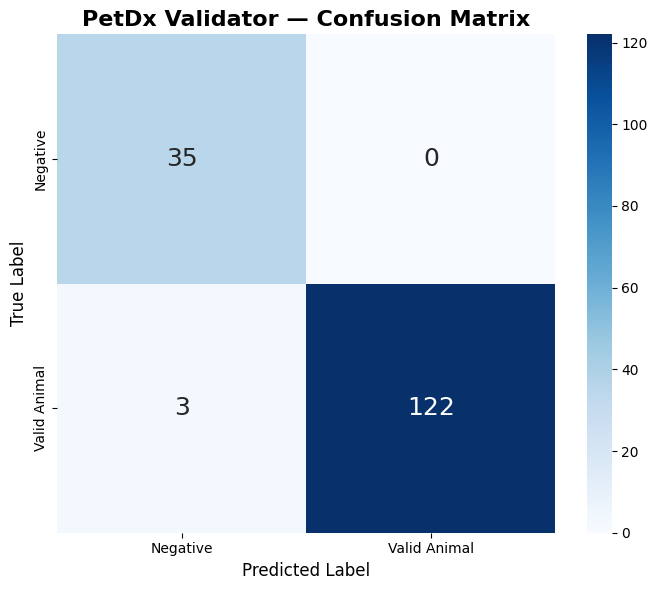


Classification Report:

              precision    recall  f1-score   support

    Negative     0.9211    1.0000    0.9589        35
Valid Animal     1.0000    0.9760    0.9879       125

    accuracy                         0.9812       160
   macro avg     0.9605    0.9880    0.9734       160
weighted avg     0.9827    0.9812    0.9815       160



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Get predictions
y_true = []
y_prob = []

for images, labels in test_ds:
    predictions = model.predict(images, verbose=0)

    y_true.extend(labels.numpy().flatten())
    y_prob.extend(predictions.flatten())

y_true = np.array(y_true)
y_prob = np.array(y_prob)

# Convert probabilities to classes
y_pred = (y_prob >= 0.5).astype(int)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot
plt.figure(figsize=(7, 6))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Negative", "Valid Animal"],
    yticklabels=["Negative", "Valid Animal"],
    annot_kws={"size": 18}
)

plt.title("PetDx Validator — Confusion Matrix", fontsize=16, fontweight="bold")
plt.xlabel("Predicted Label", fontsize=12)
plt.ylabel("True Label", fontsize=12)

plt.tight_layout()
plt.show()

# Classification report
print("\nClassification Report:\n")
print(
    classification_report(
        y_true,
        y_pred,
        target_names=["Negative", "Valid Animal"],
        digits=4
    )
)

Saving ECC-CEH-Certificate.png to ECC-CEH-Certificate.png


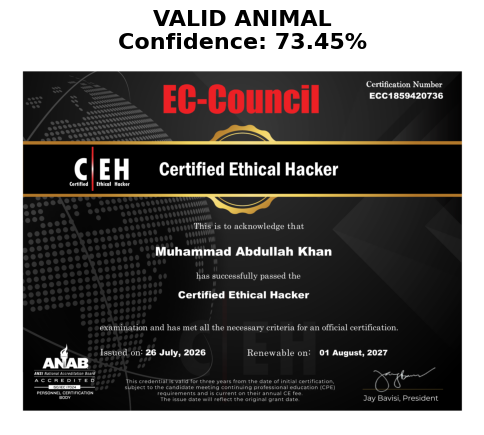

PetDx Stage-1 Validator
Image: ECC-CEH-Certificate.png
Prediction: VALID ANIMAL
Confidence: 73.45%


In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Upload image
uploaded = files.upload()

# Get uploaded filename
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)
img_array = np.expand_dims(img_array, axis=0)

# MobileNetV2 preprocessing
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Predict
probability = model.predict(img_array, verbose=0)[0][0]

# Class decision
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Display image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"{result}\nConfidence: {confidence:.2f}%",
    fontsize=16,
    fontweight="bold"
)
plt.show()

print("=" * 45)
print("PetDx Stage-1 Validator")
print("=" * 45)
print(f"Image: {filename}")
print(f"Prediction: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 45)

Saving ringworm cats.jpg to ringworm cats.jpg


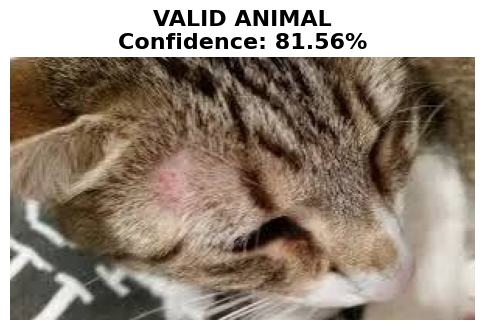

PetDx Stage-1 Validator
Image: ringworm cats.jpg
Prediction: VALID ANIMAL
Confidence: 81.56%


In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Upload image
uploaded = files.upload()

# Get uploaded filename
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)
img_array = np.expand_dims(img_array, axis=0)

# MobileNetV2 preprocessing
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Predict
probability = model.predict(img_array, verbose=0)[0][0]

# Class decision
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Display image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"{result}\nConfidence: {confidence:.2f}%",
    fontsize=16,
    fontweight="bold"
)
plt.show()

print("=" * 45)
print("PetDx Stage-1 Validator")
print("=" * 45)
print(f"Image: {filename}")
print(f"Prediction: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 45)

Saving bird.jpg to bird.jpg


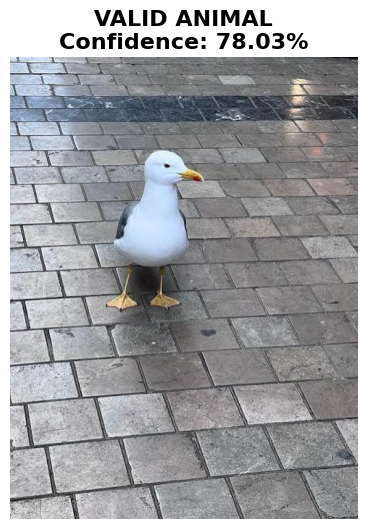

PetDx Stage-1 Validator
Image: bird.jpg
Prediction: VALID ANIMAL
Confidence: 78.03%


In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Upload image
uploaded = files.upload()

# Get uploaded filename
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)
img_array = np.expand_dims(img_array, axis=0)

# MobileNetV2 preprocessing
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Predict
probability = model.predict(img_array, verbose=0)[0][0]

# Class decision
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Display image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"{result}\nConfidence: {confidence:.2f}%",
    fontsize=16,
    fontweight="bold"
)
plt.show()

print("=" * 45)
print("PetDx Stage-1 Validator")
print("=" * 45)
print(f"Image: {filename}")
print(f"Prediction: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 45)

Saving images (1).jpg to images (1).jpg


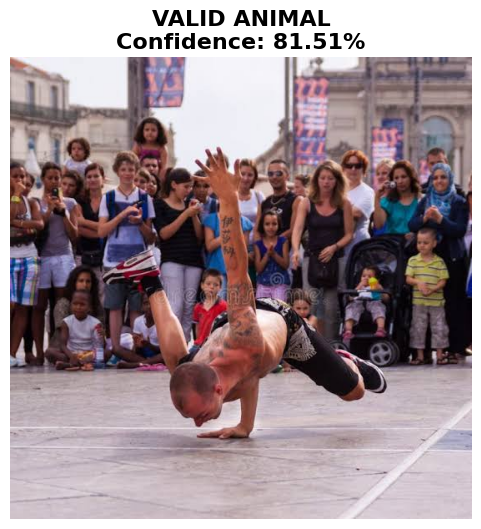

PetDx Stage-1 Validator
Image: images (1).jpg
Prediction: VALID ANIMAL
Confidence: 81.51%


In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Upload image
uploaded = files.upload()

# Get uploaded filename
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)
img_array = np.expand_dims(img_array, axis=0)

# MobileNetV2 preprocessing
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Predict
probability = model.predict(img_array, verbose=0)[0][0]

# Class decision
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Display image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"{result}\nConfidence: {confidence:.2f}%",
    fontsize=16,
    fontweight="bold"
)
plt.show()

print("=" * 45)
print("PetDx Stage-1 Validator")
print("=" * 45)
print(f"Image: {filename}")
print(f"Prediction: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 45)

Saving images (2).jpg to images (2).jpg


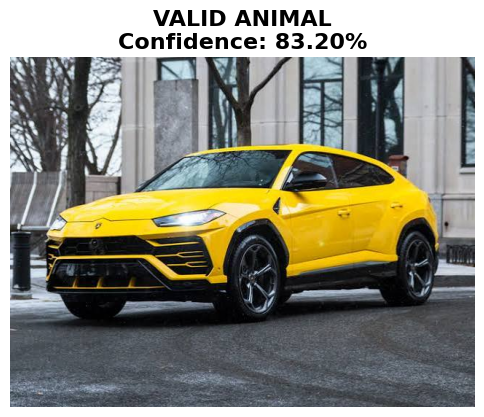

PetDx Stage-1 Validator
Image: images (2).jpg
Prediction: VALID ANIMAL
Confidence: 83.20%


In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Upload image
uploaded = files.upload()

# Get uploaded filename
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)
img_array = np.expand_dims(img_array, axis=0)

# MobileNetV2 preprocessing
img_array = tf.keras.applications.mobilenet_v2.preprocess_input(img_array)

# Predict
probability = model.predict(img_array, verbose=0)[0][0]

# Class decision
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Display image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis("off")
plt.title(
    f"{result}\nConfidence: {confidence:.2f}%",
    fontsize=16,
    fontweight="bold"
)
plt.show()

print("=" * 45)
print("PetDx Stage-1 Validator")
print("=" * 45)
print(f"Image: {filename}")
print(f"Prediction: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 45)

In [ ]:
# ============================================================
# PetDx AI - Hard Negative Downloader
# Wikimedia Commons
# ============================================================

import requests
import os
import time
import hashlib
from pathlib import Path
from PIL import Image
from io import BytesIO

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

OUTPUT_DIR = Path("/content/hard_negative")

# Target number per category
IMAGES_PER_CATEGORY = 60

# Wikimedia Commons API
API_URL = "https://commons.wikimedia.org/w/api.php"

# Proper User-Agent
HEADERS = {
    "User-Agent": "PetDxAI-DatasetResearch/1.0 (educational FYP project)"
}

# Hard-negative categories
SEARCHES = {
    "people": [
        "person",
        "people",
        "man",
        "woman",
        "dancing person",
        "human face",
        "human hand"
    ],

    "vehicles": [
        "car",
        "automobile",
        "bus",
        "motorcycle",
        "truck",
        "vehicle"
    ],

    "documents": [
        "certificate",
        "document",
        "diploma",
        "paper document",
        "identification card",
        "newspaper"
    ],

    "electronics": [
        "smartphone",
        "mobile phone",
        "laptop",
        "computer",
        "tablet",
        "television"
    ],

    "objects": [
        "chair",
        "table",
        "bottle",
        "bag",
        "backpack",
        "clock",
        "book",
        "camera"
    ],

    "buildings": [
        "building",
        "house",
        "room interior",
        "office",
        "school",
        "road"
    ],

    "clothing": [
        "shirt",
        "shoes",
        "jacket",
        "clothing",
        "hat",
        "jeans"
    ],

    "food": [
        "food",
        "pizza",
        "bread",
        "fruit",
        "vegetables",
        "meal"
    ],

    "scenery": [
        "landscape",
        "mountain landscape",
        "street",
        "forest",
        "park",
        "beach"
    ]
}


# ------------------------------------------------------------
# CREATE DIRECTORIES
# ------------------------------------------------------------

for category in SEARCHES:
    (OUTPUT_DIR / category).mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# HELPERS
# ------------------------------------------------------------

def get_image_urls(search_term, limit=100):

    params = {
        "action": "query",
        "format": "json",
        "generator": "search",

        # Search only Wikimedia Commons files
        "gsrnamespace": 6,
        "gsrsearch": search_term,
        "gsrlimit": min(limit, 50),

        # Get image information
        "prop": "imageinfo",
        "iiprop": "url|mime|size",
        "iiurlwidth": 600,

        "redirects": 1
    }

    try:
        response = requests.get(
            API_URL,
            params=params,
            headers=HEADERS,
            timeout=30
        )

        response.raise_for_status()

        data = response.json()

        pages = data.get("query", {}).get("pages", {})

        results = []

        for page in pages.values():

            imageinfo = page.get("imageinfo", [])

            if not imageinfo:
                continue

            info = imageinfo[0]

            mime = info.get("mime", "")

            if not mime.startswith("image/"):
                continue

            url = info.get("thumburl") or info.get("url")

            if url:
                results.append(url)

        return results

    except Exception as e:
        print("Search error:", search_term, "|", e)
        return []


def download_image(url, save_path):

    try:

        response = requests.get(
            url,
            headers=HEADERS,
            timeout=30
        )

        if response.status_code != 200:
            return False

        image = Image.open(BytesIO(response.content))

        # Convert to RGB
        image = image.convert("RGB")

        # Reject extremely small images
        width, height = image.size

        if width < 150 or height < 150:
            return False

        # Resize to reasonable size
        image.thumbnail((1000, 1000))

        image.save(
            save_path,
            "JPEG",
            quality=90
        )

        return True

    except Exception:
        return False


def file_hash(path):

    try:
        with open(path, "rb") as f:
            return hashlib.md5(f.read()).hexdigest()

    except:
        return None


# ------------------------------------------------------------
# DOWNLOAD
# ------------------------------------------------------------

total_downloaded = 0

for category, search_terms in SEARCHES.items():

    category_dir = OUTPUT_DIR / category

    print("\n" + "=" * 60)
    print(f" CATEGORY: {category}")
    print("=" * 60)

    downloaded = 0
    hashes = set()

    image_index = 0

    for search_term in search_terms:

        if downloaded >= IMAGES_PER_CATEGORY:
            break

        print(f"\nSearching: {search_term}")

        urls = get_image_urls(
            search_term,
            limit=50
        )

        print(f"Found {len(urls)} image results")

        for url in urls:

            if downloaded >= IMAGES_PER_CATEGORY:
                break

            filename = category_dir / f"{category}_{downloaded+1:04d}.jpg"

            success = download_image(
                url,
                filename
            )

            if not success:
                continue

            # Duplicate check
            h = file_hash(filename)

            if h in hashes:
                filename.unlink(missing_ok=True)
                continue

            hashes.add(h)

            downloaded += 1
            total_downloaded += 1

            print(
                f"  [{downloaded}/{IMAGES_PER_CATEGORY}] "
                f"Downloaded"
            )

            time.sleep(0.15)

    print(
        f"\n{category}: {downloaded} images downloaded"
    )


# ------------------------------------------------------------
# FINAL REPORT
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("DOWNLOAD COMPLETE")
print("=" * 60)

grand_total = 0

for category in SEARCHES:

    folder = OUTPUT_DIR / category

    count = len([
        f for f in folder.iterdir()
        if f.is_file() and f.suffix.lower() == ".jpg"
    ])

    grand_total += count

    print(f"{category:15s}: {count}")

print("-" * 60)
print(f"{'TOTAL':15s}: {grand_total}")
print("=" * 60)


 CATEGORY: people

Searching: person
Found 50 image results
  [1/60] Downloaded
  [2/60] Downloaded
  [3/60] Downloaded
  [4/60] Downloaded
  [5/60] Downloaded
  [6/60] Downloaded
  [7/60] Downloaded
  [8/60] Downloaded
  [9/60] Downloaded
  [10/60] Downloaded
  [11/60] Downloaded
  [12/60] Downloaded
  [13/60] Downloaded
  [14/60] Downloaded
  [15/60] Downloaded
  [16/60] Downloaded
  [17/60] Downloaded
  [18/60] Downloaded
  [19/60] Downloaded
  [20/60] Downloaded
  [21/60] Downloaded
  [22/60] Downloaded
  [23/60] Downloaded
  [24/60] Downloaded
  [25/60] Downloaded
  [26/60] Downloaded
  [27/60] Downloaded
  [28/60] Downloaded
  [29/60] Downloaded
  [30/60] Downloaded
  [31/60] Downloaded
  [32/60] Downloaded
  [33/60] Downloaded
  [34/60] Downloaded
  [35/60] Downloaded
  [36/60] Downloaded
  [37/60] Downloaded
  [38/60] Downloaded
  [39/60] Downloaded
  [40/60] Downloaded
  [41/60] Downloaded
  [42/60] Downloaded
  [43/60] Downloaded
  [44/60] Downloaded
  [45/60] Downloaded
  [

In [ ]:
from pathlib import Path

HARD_NEGATIVE_DIR = Path("/content/hard_negative")

total = 0

print("Hard Negative Dataset")
print("=" * 40)

for folder in sorted(HARD_NEGATIVE_DIR.iterdir()):
    if folder.is_dir():
        count = len([
            f for f in folder.iterdir()
            if f.is_file() and f.suffix.lower() in {".jpg", ".jpeg", ".png", ".webp"}
        ])

        print(f"{folder.name:15s}: {count}")
        total += count

print("=" * 40)
print(f"TOTAL: {total}")

Hard Negative Dataset
buildings      : 60
clothing       : 60
documents      : 60
electronics    : 60
food           : 60
objects        : 60
people         : 60
scenery        : 60
vehicles       : 60
TOTAL: 540


In [ ]:
from pathlib import Path
import shutil

# Original dataset
original_negative = Path("/content/Validator/negative")

# Hard negatives
hard_negative = Path("/content/hard_negative")

# Destination for combined negatives
combined_negative = Path("/content/Validator_Improved/negative")
combined_valid = Path("/content/Validator_Improved/valid_animal")

combined_negative.mkdir(parents=True, exist_ok=True)
combined_valid.mkdir(parents=True, exist_ok=True)

# Copy original valid animal images
for f in original_negative.parent.joinpath("..").resolve().glob("*"):
    pass

# Copy valid animal dataset
for f in Path("/content/Validator/valid_animal").iterdir():
    if f.is_file():
        shutil.copy2(
            f,
            combined_valid / f"valid_{f.name}"
        )

# Copy original negatives
for f in original_negative.iterdir():
    if f.is_file():
        shutil.copy2(
            f,
            combined_negative / f"original_{f.name}"
        )

# Copy hard negatives from all categories
for category in hard_negative.iterdir():

    if not category.is_dir():
        continue

    for f in category.iterdir():

        if f.is_file():
            shutil.copy2(
                f,
                combined_negative / f"{category.name}_{f.name}"
            )

print("Improved dataset created!")

Improved dataset created!


In [ ]:
from pathlib import Path

dataset = Path("/content/Validator_Improved")

valid_count = len([
    f for f in (dataset / "valid_animal").iterdir()
    if f.is_file()
])

negative_count = len([
    f for f in (dataset / "negative").iterdir()
    if f.is_file()
])

print("Valid animal:", valid_count)
print("Negative:", negative_count)
print("Total:", valid_count + negative_count)

Valid animal: 1242
Negative: 890
Total: 2132


In [ ]:
from pathlib import Path
from sklearn.model_selection import train_test_split
import shutil
import random

SOURCE = Path("/content/Validator_Improved")
OUTPUT = Path("/content/PetDx_Validator_V2_Split")

random.seed(42)

classes = ["valid_animal", "negative"]
extensions = {".jpg", ".jpeg", ".png", ".webp"}

# Create directories
for split in ["train", "val", "test"]:
    for class_name in classes:
        (OUTPUT / split / class_name).mkdir(
            parents=True,
            exist_ok=True
        )

for class_name in classes:

    files = [
        f for f in (SOURCE / class_name).iterdir()
        if f.is_file() and f.suffix.lower() in extensions
    ]

    random.shuffle(files)

    # 80% train / 20% temporary
    train_files, temp_files = train_test_split(
        files,
        test_size=0.20,
        random_state=42
    )

    # 10% validation / 10% test
    val_files, test_files = train_test_split(
        temp_files,
        test_size=0.50,
        random_state=42
    )

    for f in train_files:
        shutil.copy2(
            f,
            OUTPUT / "train" / class_name / f.name
        )

    for f in val_files:
        shutil.copy2(
            f,
            OUTPUT / "val" / class_name / f.name
        )

    for f in test_files:
        shutil.copy2(
            f,
            OUTPUT / "test" / class_name / f.name
        )

    print(f"\n{class_name}")
    print("Total:", len(files))
    print("Train:", len(train_files))
    print("Validation:", len(val_files))
    print("Test:", len(test_files))

print("\nVersion 2 split completed!")


valid_animal
Total: 1242
Train: 993
Validation: 124
Test: 125

negative
Total: 890
Train: 712
Validation: 89
Test: 89

Version 2 split completed!


In [ ]:
from pathlib import Path

OUTPUT = Path("/content/PetDx_Validator_V2_Split")

print("\nVersion 2 Dataset")
print("=" * 45)

for split in ["train", "val", "test"]:

    print(f"\n{split.upper()}")

    for class_name in ["negative", "valid_animal"]:

        count = len([
            f for f in (OUTPUT / split / class_name).iterdir()
            if f.is_file()
        ])

        print(f"{class_name}: {count}")


Version 2 Dataset

TRAIN
negative: 712
valid_animal: 993

VAL
negative: 89
valid_animal: 124

TEST
negative: 89
valid_animal: 125


In [ ]:
import tensorflow as tf
from pathlib import Path

DATASET_DIR_V2 = Path("/content/PetDx_Validator_V2_Split")

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

train_ds_v2 = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR_V2 / "train",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=True,
    seed=SEED
)

val_ds_v2 = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR_V2 / "val",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=False
)

test_ds_v2 = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR_V2 / "test",
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="binary",
    shuffle=False
)

print("\nClass names:", train_ds_v2.class_names)
print("V2 datasets loaded successfully!")

Found 1705 files belonging to 2 classes.
Found 213 files belonging to 2 classes.
Found 214 files belonging to 2 classes.

Class names: ['negative', 'valid_animal']
V2 datasets loaded successfully!


In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Class order from TensorFlow:
# 0 = negative
# 1 = valid_animal

class_counts = np.array([712, 993])
class_indices = np.array([0, 1])

weights = compute_class_weight(
    class_weight="balanced",
    classes=class_indices,
    y=np.repeat(class_indices, class_counts)
)

class_weights_v2 = {
    0: float(weights[0]),
    1: float(weights[1])
}

print("V2 Class Weights")
print("=" * 30)
print(f"Negative     (0): {class_weights_v2[0]:.4f}")
print(f"Valid Animal (1): {class_weights_v2[1]:.4f}")

V2 Class Weights
Negative     (0): 1.1973
Valid Animal (1): 0.8585


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Data augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.08),
    layers.RandomZoom(0.10),
    layers.RandomContrast(0.10),
], name="data_augmentation")

# MobileNetV2 base
base_model_v2 = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

# Freeze pretrained layers initially
base_model_v2.trainable = False

# Build V2 validator
model_v2 = models.Sequential([
    layers.Input(shape=(224, 224, 3)),

    data_augmentation,

    layers.Lambda(
        tf.keras.applications.mobilenet_v2.preprocess_input
    ),

    base_model_v2,

    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.30),

    layers.Dense(128, activation="relu"),
    layers.Dropout(0.20),

    layers.Dense(1, activation="sigmoid")
])

model_v2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Compile V2 model

model_v2.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=[
        "accuracy",
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall")
    ]
)

# Callbacks
checkpoint_v2 = tf.keras.callbacks.ModelCheckpoint(
    "/content/petdx_validator_v2_best.keras",
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)

early_stopping_v2 = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True,
    verbose=1
)

reduce_lr_v2 = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=2,
    min_lr=1e-7,
    verbose=1
)

print("V2 model compiled successfully!")

V2 model compiled successfully!


In [ ]:
# Train Version 2 validator

history_v2 = model_v2.fit(
    train_ds_v2,
    validation_data=val_ds_v2,
    epochs=25,
    class_weight=class_weights_v2,
    callbacks=[
        checkpoint_v2,
        early_stopping_v2,
        reduce_lr_v2
    ]
)

print("\nV2 training completed!")

Epoch 1/25
54/54 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.6459 - loss: 0.6662 - precision: 0.6853 - recall: 0.6818
Epoch 1: val_loss improved from None to 0.34981, saving model to /content/petdx_validator_v2_best.keras

Epoch 1: finished saving model to /content/petdx_validator_v2_best.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 17s 186ms/step - accuracy: 0.7015 - loss: 0.5692 - precision: 0.7510 - recall: 0.7291 - val_accuracy: 0.9202 - val_loss: 0.3498 - val_precision: 0.9023 - val_recall: 0.9677 - learning_rate: 1.0000e-04
Epoch 2/25
53/54 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.8798 - loss: 0.3555 - precision: 0.8774 - recall: 0.9166
Epoch 2: val_loss improved from 0.34981 to 0.23974, saving model to /content/petdx_validator_v2_best.keras

Epoch 2: finished saving model to /content/petdx_validator_v2_best.keras
54/54 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.8921 - loss: 0.3218 - precision: 0.9049 - recall: 0.9104 - val_accuracy: 0.9437 - val_loss: 0.2397 - val_precisio

In [ ]:
# Evaluate V2 on the unseen test set

test_results_v2 = model_v2.evaluate(
    test_ds_v2,
    verbose=1
)

print("\nV2 Test Results")
print("=" * 40)

for name, value in zip(model_v2.metrics_names, test_results_v2):
    print(f"{name}: {value:.4f}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9860 - loss: 0.0605 - precision: 0.9919 - recall: 0.9840

V2 Test Results
loss: 0.0605
compile_metrics: 0.9860


V2 CLASSIFICATION REPORT
              precision    recall  f1-score   support

    Negative     0.9778    0.9888    0.9832        89
Valid Animal     0.9919    0.9840    0.9880       125

    accuracy                         0.9860       214
   macro avg     0.9849    0.9864    0.9856       214
weighted avg     0.9860    0.9860    0.9860       214


V2 CONFUSION MATRIX
[[ 88   1]
 [  2 123]]


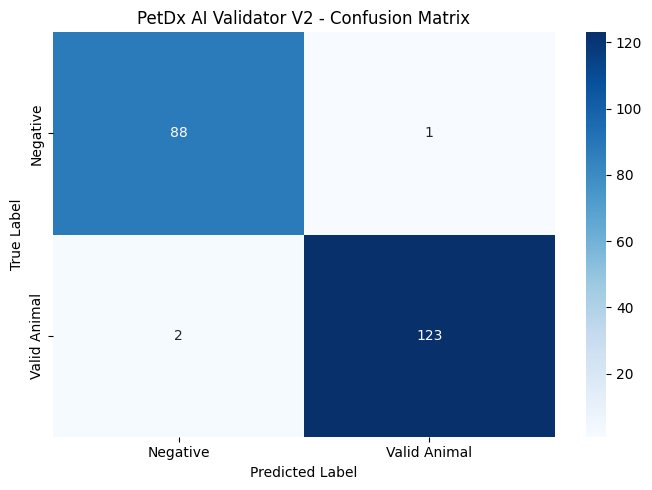

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get true labels and predictions
y_true = []
y_pred = []

for images, labels in test_ds_v2:
    predictions = model_v2.predict(images, verbose=0)

    y_true.extend(labels.numpy().flatten().astype(int))
    y_pred.extend((predictions.flatten() >= 0.5).astype(int))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Class names
class_names = ["Negative", "Valid Animal"]

# Classification Report
print("V2 CLASSIFICATION REPORT")
print("=" * 60)

print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names,
        digits=4
    )
)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

print("\nV2 CONFUSION MATRIX")
print("=" * 60)
print(cm)

# Plot confusion matrix
plt.figure(figsize=(7, 5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("PetDx AI Validator V2 - Confusion Matrix")
plt.tight_layout()
plt.show()

Saving images (1).jpg to images (1) (1).jpg

PetDx AI - Validator V2 Real-World Results

Image: images (1) (1).jpg
Prediction: NEGATIVE
Confidence: 68.72%



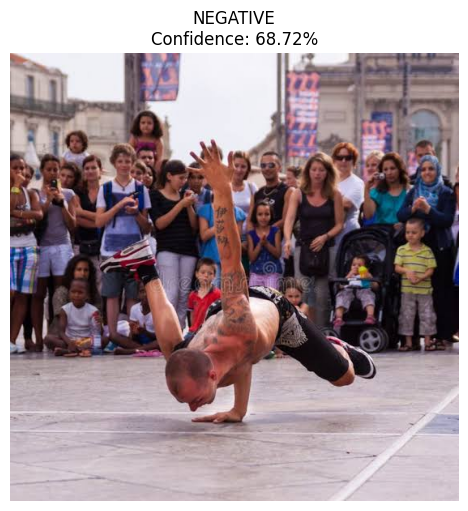

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving images (2).jpg to images (2) (1).jpg

PetDx AI - Validator V2 Real-World Results

Image: images (2) (1).jpg
Prediction: NEGATIVE
Confidence: 60.24%



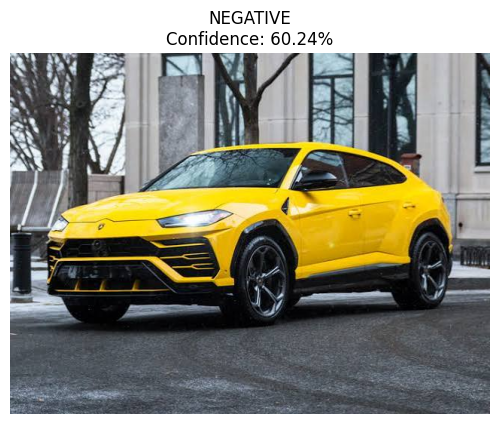

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving bird.jpg to bird (1).jpg

PetDx AI - Validator V2 Real-World Results

Image: bird (1).jpg
Prediction: NEGATIVE
Confidence: 70.74%



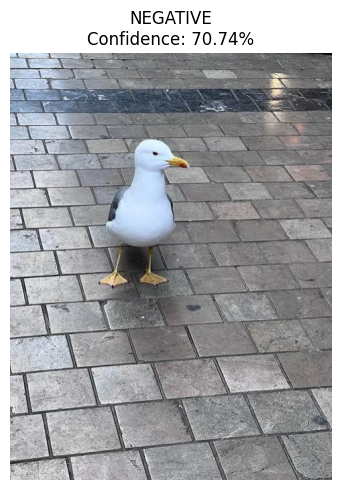

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving dermititis cat.jpg to dermititis cat.jpg

PetDx AI - Validator V2 Real-World Results

Image: dermititis cat.jpg
Prediction: NEGATIVE
Confidence: 71.98%



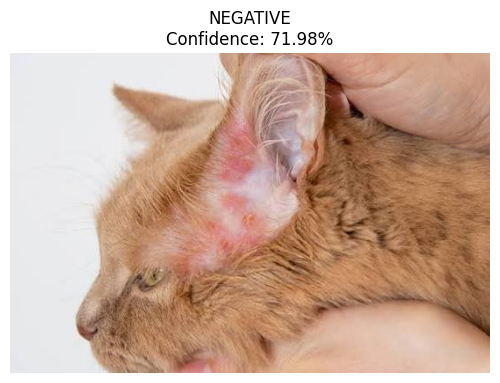

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving Flea allergy cat.jpg to Flea allergy cat.jpg

PetDx AI - Validator V2 Real-World Results

Image: Flea allergy cat.jpg
Prediction: NEGATIVE
Confidence: 69.25%



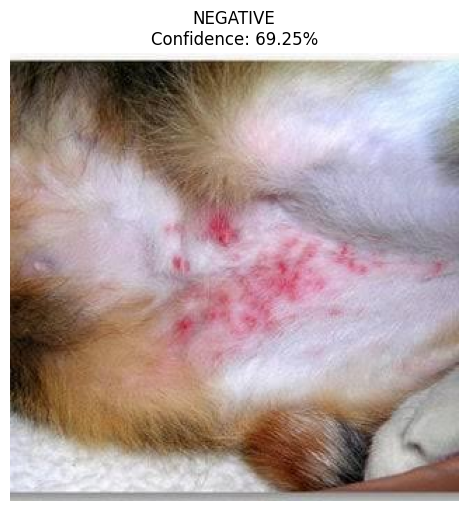

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving ringworm cats.jpg to ringworm cats (1).jpg

PetDx AI - Validator V2 Real-World Results

Image: ringworm cats (1).jpg
Prediction: NEGATIVE
Confidence: 68.14%



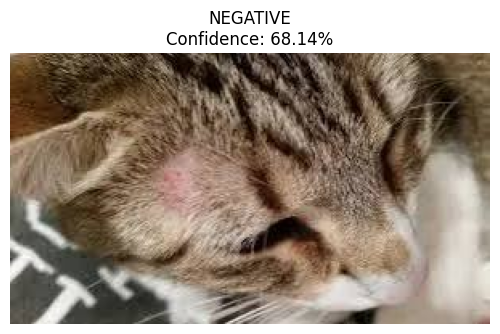

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize
        img_resized = img.resize((224, 224))

        # Convert to array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # MobileNetV2 preprocessing
        img_array = tf.keras.applications.mobilenet_v2.preprocess_input(
            img_array
        )

        # Prediction
        probability = float(model_v2.predict(img_array, verbose=0)[0][0])

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append((filename, result, confidence))

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Display results
# ==========================================

print("\n" + "=" * 65)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 65)

for filename, result, confidence in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")

print("\n" + "=" * 65)


# ==========================================
# Display uploaded images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\nConfidence: {confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving ringworm cats.jpg to ringworm cats (2).jpg

PetDx AI - Validator V2 Real-World Results

Image: ringworm cats (2).jpg
Prediction: VALID ANIMAL
Confidence: 99.99%
Raw probability: 0.9999



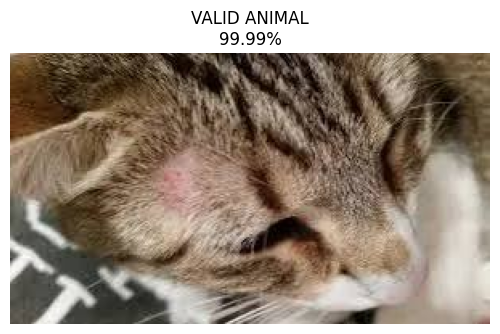

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving dermititis cat.jpg to dermititis cat (1).jpg

PetDx AI - Validator V2 Real-World Results

Image: dermititis cat (1).jpg
Prediction: VALID ANIMAL
Confidence: 99.98%
Raw probability: 0.9998



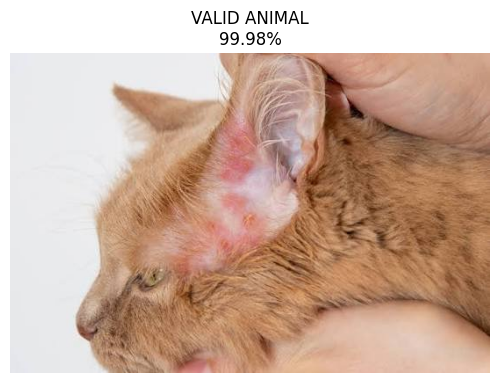

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving EmIO-PRVgAAlu2e_jpg.rf.8862b35d66be58af629847c84be99a63.jpg to EmIO-PRVgAAlu2e_jpg.rf.8862b35d66be58af629847c84be99a63.jpg

PetDx AI - Validator V2 Real-World Results

Image: EmIO-PRVgAAlu2e_jpg.rf.8862b35d66be58af629847c84be99a63.jpg
Prediction: VALID ANIMAL
Confidence: 63.21%
Raw probability: 0.6321



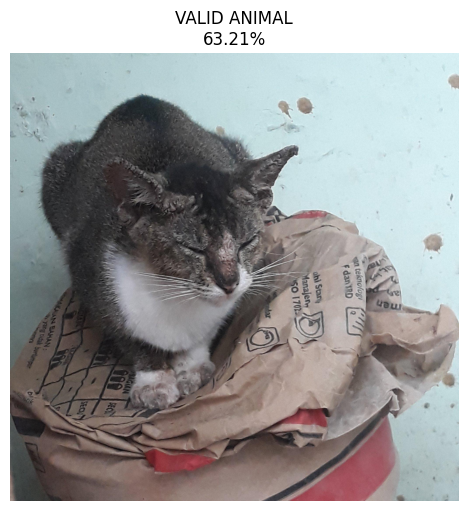

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving bird.jpg to bird (2).jpg

PetDx AI - Validator V2 Real-World Results

Image: bird (2).jpg
Prediction: NEGATIVE
Confidence: 54.09%
Raw probability: 0.4591



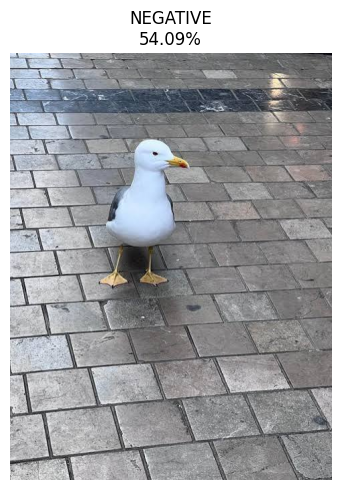

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving IMG_4611.jpeg to IMG_4611.jpeg

PetDx AI - Validator V2 Real-World Results

Image: IMG_4611.jpeg
Prediction: NEGATIVE
Confidence: 99.02%
Raw probability: 0.0098



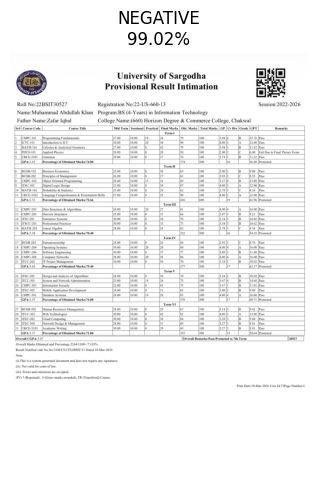

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving CEH_2E345519D3F7.png to CEH_2E345519D3F7.png

PetDx AI - Validator V2 Real-World Results

Image: CEH_2E345519D3F7.png
Prediction: NEGATIVE
Confidence: 98.21%
Raw probability: 0.0179



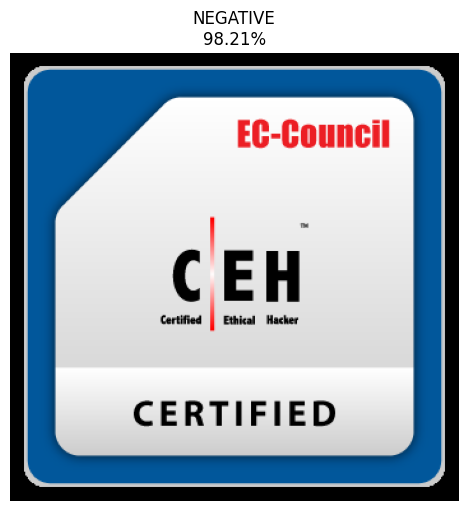

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving Personal Picture.png to Personal Picture.png

PetDx AI - Validator V2 Real-World Results

Image: Personal Picture.png
Prediction: NEGATIVE
Confidence: 97.15%
Raw probability: 0.0285



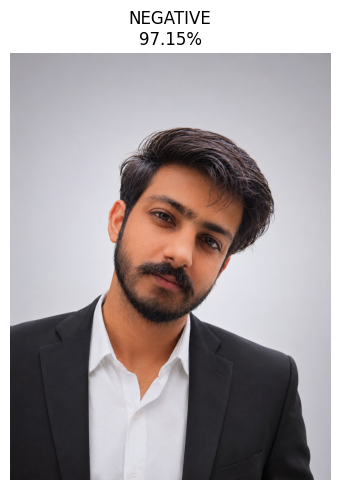

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import math

# ==========================================
# PetDx AI - Validator V2 Real-World Test
# Correct preprocessing
# ==========================================

uploaded = files.upload()

results = []

for filename, file_data in uploaded.items():

    try:
        # Load image
        img = Image.open(filename).convert("RGB")

        # Resize only
        img_resized = img.resize((224, 224))

        # Convert to float array
        img_array = np.array(img_resized, dtype=np.float32)

        # Add batch dimension
        img_array = np.expand_dims(img_array, axis=0)

        # IMPORTANT:
        # DO NOT call preprocess_input here.
        # V2 model already contains MobileNetV2 preprocessing.

        probability = float(
            model_v2.predict(img_array, verbose=0)[0][0]
        )

        # Classification
        if probability >= 0.5:
            result = "VALID ANIMAL"
            confidence = probability * 100
        else:
            result = "NEGATIVE"
            confidence = (1 - probability) * 100

        results.append(
            (filename, result, confidence, probability)
        )

    except Exception as e:
        print(f"Error processing {filename}: {e}")


# ==========================================
# Results
# ==========================================

print("\n" + "=" * 70)
print("PetDx AI - Validator V2 Real-World Results")
print("=" * 70)

for filename, result, confidence, probability in results:

    print(f"\nImage: {filename}")
    print(f"Prediction: {result}")
    print(f"Confidence: {confidence:.2f}%")
    print(f"Raw probability: {probability:.4f}")

print("\n" + "=" * 70)


# ==========================================
# Display images
# ==========================================

if results:

    cols = 3
    rows = math.ceil(len(results) / cols)

    plt.figure(figsize=(15, 5 * rows))

    for i, (filename, result, confidence, probability) in enumerate(results):

        img = Image.open(filename).convert("RGB")

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

        plt.title(
            f"{result}\n{confidence:.2f}%",
            fontsize=12
        )

    plt.tight_layout()
    plt.show()

Saving PHOTO-2026-05-12-22-19-18.jpg to PHOTO-2026-05-12-22-19-18.jpg
PetDx AI Validator V2
Image: PHOTO-2026-05-12-22-19-18.jpg
Result: NEGATIVE
Confidence: 98.00%


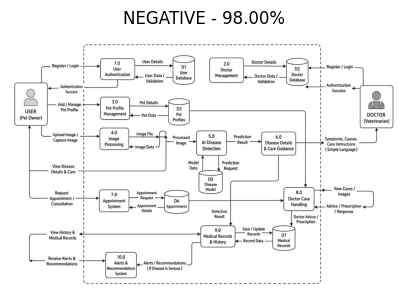

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving PHOTO-2026-05-10-21-12-12.jpg to PHOTO-2026-05-10-21-12-12.jpg
PetDx AI Validator V2
Image: PHOTO-2026-05-10-21-12-12.jpg
Result: NEGATIVE
Confidence: 95.11%


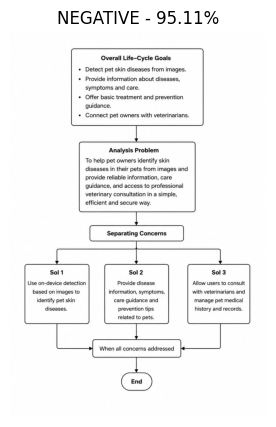

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving 14_JPG_JPG.rf.f0ca73ede002e4cc0601cb90d1abb4ba.jpg to 14_JPG_JPG.rf.f0ca73ede002e4cc0601cb90d1abb4ba.jpg
PetDx AI Validator V2
Image: 14_JPG_JPG.rf.f0ca73ede002e4cc0601cb90d1abb4ba.jpg
Result: NEGATIVE
Confidence: 64.84%


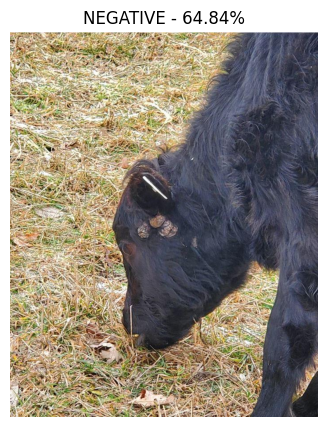

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443.jpg to 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443.jpg
PetDx AI Validator V2
Image: 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443.jpg
Result: VALID ANIMAL
Confidence: 99.95%


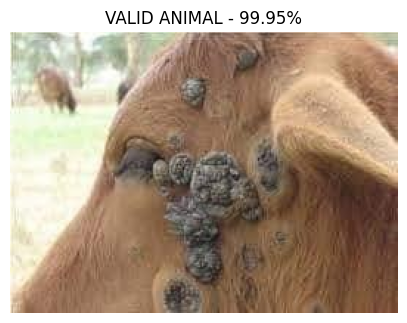

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443.jpg to 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443 (1).jpg
PetDx AI Validator V2
Image: 76_jpg.rf.f4851c6afbe7b14fa46b35dadad29443 (1).jpg
Result: VALID ANIMAL
Confidence: 99.95%


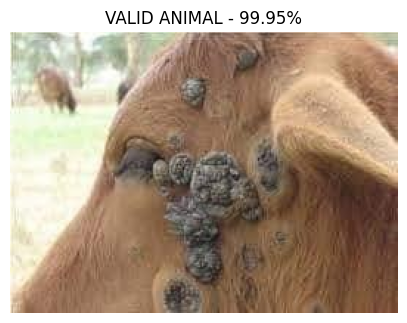

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving 12_jpg.rf.05d718aaa43356edb49e9f38e7bcd5c1.jpg to 12_jpg.rf.05d718aaa43356edb49e9f38e7bcd5c1.jpg
PetDx AI Validator V2
Image: 12_jpg.rf.05d718aaa43356edb49e9f38e7bcd5c1.jpg
Result: VALID ANIMAL
Confidence: 96.95%


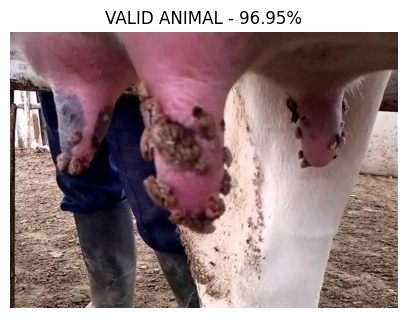

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving train_Copy-of-00000010_aug1_jpg.rf.e55789ca8ba3e08abc285e29f9008166.jpg to train_Copy-of-00000010_aug1_jpg.rf.e55789ca8ba3e08abc285e29f9008166.jpg
PetDx AI Validator V2
Image: train_Copy-of-00000010_aug1_jpg.rf.e55789ca8ba3e08abc285e29f9008166.jpg
Result: VALID ANIMAL
Confidence: 99.70%


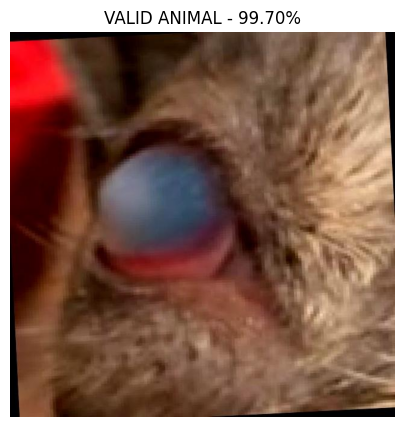

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving train_download-4-_jpg.rf.625d92ca622d5c2723575af2a455833b.jpg to train_download-4-_jpg.rf.625d92ca622d5c2723575af2a455833b.jpg
PetDx AI Validator V2
Image: train_download-4-_jpg.rf.625d92ca622d5c2723575af2a455833b.jpg
Result: VALID ANIMAL
Confidence: 99.96%


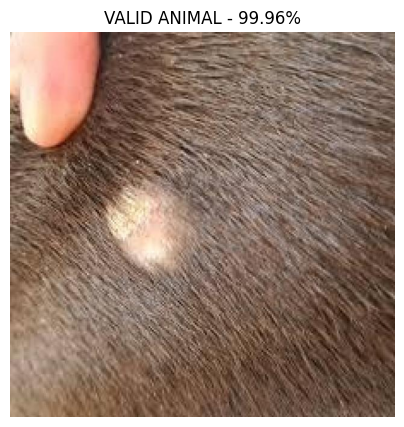

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving train_462554318_916034730417189_8045558749099284457_n-Copy-5-Copy-Copy_aug1_jpg.rf.cd054420d15afd372d3b15a99e63e3bb.jpg to train_462554318_916034730417189_8045558749099284457_n-Copy-5-Copy-Copy_aug1_jpg.rf.cd054420d15afd372d3b15a99e63e3bb.jpg
PetDx AI Validator V2
Image: train_462554318_916034730417189_8045558749099284457_n-Copy-5-Copy-Copy_aug1_jpg.rf.cd054420d15afd372d3b15a99e63e3bb.jpg
Result: VALID ANIMAL
Confidence: 99.98%


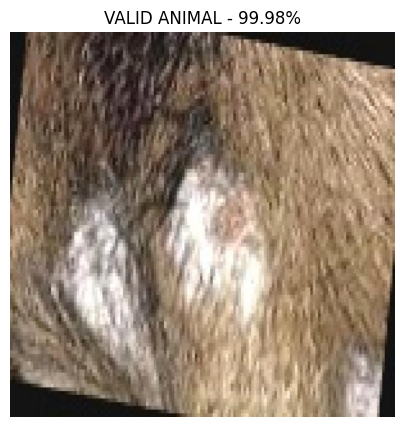

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving train_caseous_lymphadenitis_33_aug1_jpg.rf.3e2a0fe92ebe637ba86b969bfc045131.jpg to train_caseous_lymphadenitis_33_aug1_jpg.rf.3e2a0fe92ebe637ba86b969bfc045131.jpg
PetDx AI Validator V2
Image: train_caseous_lymphadenitis_33_aug1_jpg.rf.3e2a0fe92ebe637ba86b969bfc045131.jpg
Result: VALID ANIMAL
Confidence: 99.01%


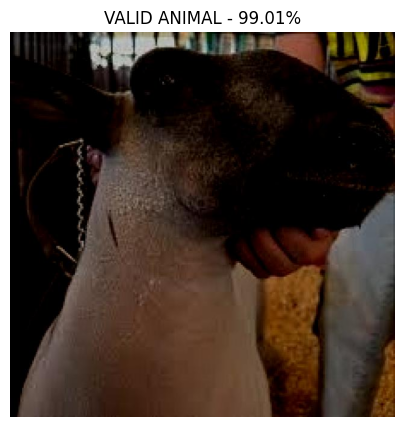

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving images (3).jpg to images (3).jpg
PetDx AI Validator V2
Image: images (3).jpg
Result: NEGATIVE
Confidence: 96.03%


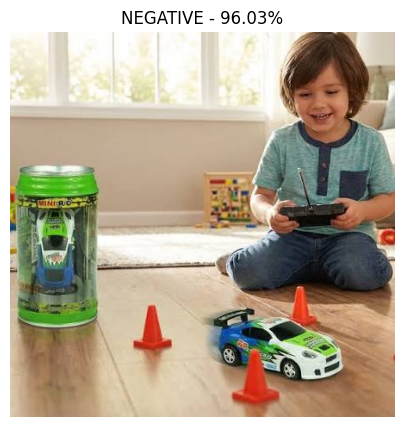

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

Saving Fungal_Infections_001011.jpg to Fungal_Infections_001011.jpg
PetDx AI Validator V2
Image: Fungal_Infections_001011.jpg
Result: VALID ANIMAL
Confidence: 99.87%


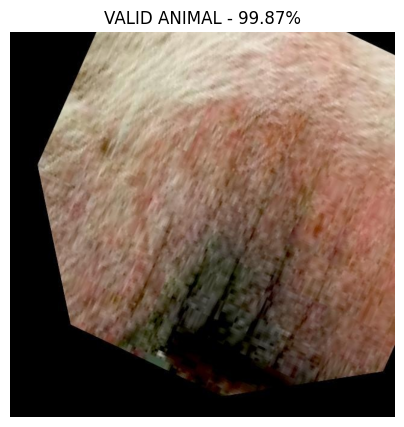

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload one image
uploaded = files.upload()
filename = next(iter(uploaded))

# Load image
img = Image.open(filename).convert("RGB")

# Resize
img_resized = img.resize((224, 224))

# Convert to array
img_array = np.array(img_resized, dtype=np.float32)

# Add batch dimension
img_array = np.expand_dims(img_array, axis=0)

# IMPORTANT:
# Do NOT use preprocess_input here.
# model_v2 already does it internally.

# Predict
probability = float(model_v2.predict(img_array, verbose=0)[0][0])

# Result
if probability >= 0.5:
    result = "VALID ANIMAL"
    confidence = probability * 100
else:
    result = "NEGATIVE"
    confidence = (1 - probability) * 100

# Show result
print("=" * 40)
print("PetDx AI Validator V2")
print("=" * 40)
print(f"Image: {filename}")
print(f"Result: {result}")
print(f"Confidence: {confidence:.2f}%")
print("=" * 40)

# Display image
plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.title(f"{result} - {confidence:.2f}%")
plt.show()

In [ ]:
from google.colab import files

files.download("/content/petdx_validator_v2_best.keras")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saving Fungal_Infections_000644.jpg to Fungal_Infections_000644.jpg
Filename                 Size        AR      Result         Conf %    Note
Fungal_Infections_000644.jpg640x640     1.0     VALID ANIMAL   94.46     


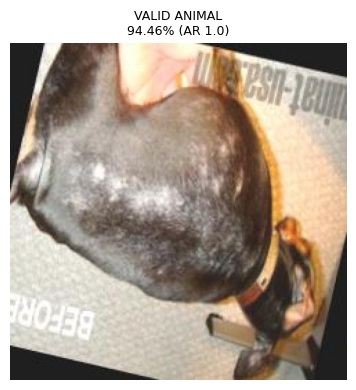

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (4).jpg to images (4).jpg
Filename                 Size        AR      Result         Conf %    Note
images (4).jpg           415x737     0.56    NEGATIVE       99.1      


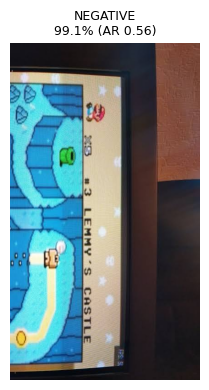

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (6).jpg to images (6).jpg
Filename                 Size        AR      Result         Conf %    Note
images (6).jpg           452x678     0.67    VALID ANIMAL   97.12     


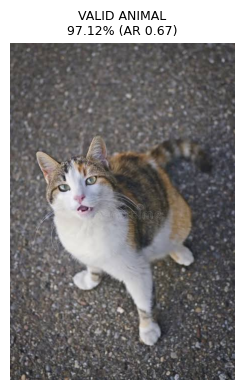

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (5).jpg to images (5).jpg
Filename                 Size        AR      Result         Conf %    Note
images (5).jpg           738x246     3.0     NEGATIVE       96.69     ⚠️ extreme AR


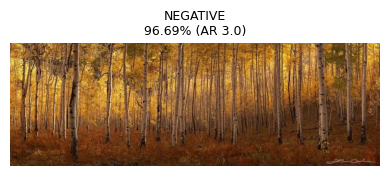

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (7).jpg to images (7).jpg
Filename                 Size        AR      Result         Conf %    Note
images (7).jpg           365x547     0.67    NEGATIVE       97.67     


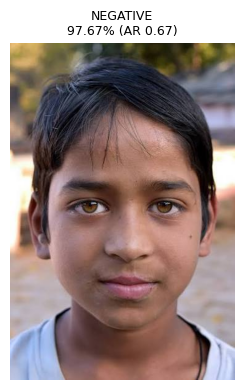

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (8).jpg to images (8).jpg
Filename                 Size        AR      Result         Conf %    Note
images (8).jpg           415x737     0.56    NEGATIVE       99.72     


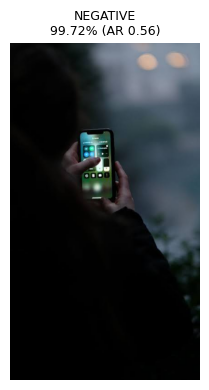

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (9).jpg to images (9).jpg
Filename                 Size        AR      Result         Conf %    Note
images (9).jpg           572x479     1.19    NEGATIVE       97.89     


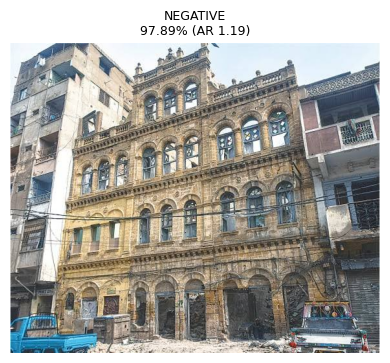

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (10).jpg to images (10).jpg
Filename                 Size        AR      Result         Conf %    Note
images (10).jpg          554x554     1.0     VALID ANIMAL   92.83     


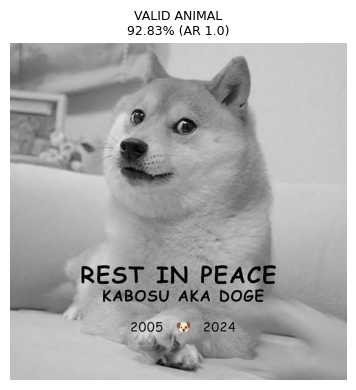

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (11).jpg to images (11).jpg
Filename                 Size        AR      Result         Conf %    Note
images (11).jpg          554x554     1.0     VALID ANIMAL   97.89     


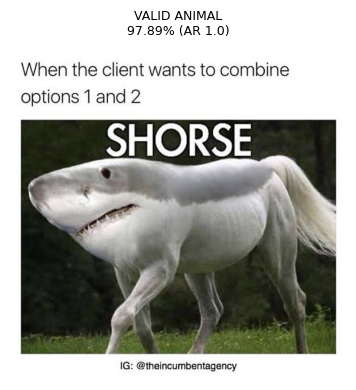

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

Saving images (12).jpg to images (12).jpg
Filename                 Size        AR      Result         Conf %    Note
images (12).jpg          399x769     0.52    VALID ANIMAL   99.32     ⚠️ extreme AR


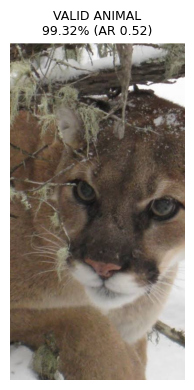

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Upload multiple images at once (select several files in the dialog)
uploaded = files.upload()

results = []

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    orig_w, orig_h = img.size
    aspect_ratio = orig_w / orig_h

    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # IMPORTANT: no preprocess_input here — model_v2 does it internally
    probability = float(model_v2.predict(img_array, verbose=0)[0][0])

    if probability >= 0.5:
        result = "VALID ANIMAL"
        confidence = probability * 100
    else:
        result = "NEGATIVE"
        confidence = (1 - probability) * 100

    flag = "⚠️ extreme AR" if (aspect_ratio > 1.8 or aspect_ratio < 0.55) else ""

    results.append({
        "filename": filename,
        "size": f"{orig_w}x{orig_h}",
        "aspect_ratio": round(aspect_ratio, 2),
        "result": result,
        "confidence": round(confidence, 2),
        "flag": flag
    })

# Print summary table
print("=" * 90)
print(f"{'Filename':<25}{'Size':<12}{'AR':<8}{'Result':<15}{'Conf %':<10}{'Note'}")
print("=" * 90)
for r in results:
    print(f"{r['filename']:<25}{r['size']:<12}{r['aspect_ratio']:<8}{r['result']:<15}{r['confidence']:<10}{r['flag']}")
print("=" * 90)

# Display all images in a grid
n = len(results)
cols = min(4, n)
rows = (n + cols - 1) // cols
plt.figure(figsize=(4 * cols, 4 * rows))
for i, r in enumerate(results):
    img = Image.open(r["filename"]).convert("RGB")
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{r['result']}\n{r['confidence']}% (AR {r['aspect_ratio']})", fontsize=9)
plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf

# Convert the trained Keras model to TensorFlow Lite
converter = tf.lite.TFLiteConverter.from_keras_model(model_v2)

# Standard optimization (reduces size, minimal accuracy impact)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

# Save to disk
tflite_path = "/content/petdx_validator_v2.tflite"
with open(tflite_path, "wb") as f:
    f.write(tflite_model)

import os
size_kb = os.path.getsize(tflite_path) / 1024
print(f"TFLite model saved: {tflite_path}")
print(f"Size: {size_kb:.1f} KB")

Saved artifact at '/tmp/tmpqbspooos'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_323')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  139572256666448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256667216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256667024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256667408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256666256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256666640: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256668176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256667984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256668368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139572256666064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1395722566

In [ ]:
import numpy as np
import tensorflow as tf
from PIL import Image
from google.colab import files

# Load the TFLite interpreter
interpreter = tf.lite.Interpreter(model_path="/content/petdx_validator_v2.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("TFLite input shape:", input_details[0]['shape'])
print("TFLite input dtype:", input_details[0]['dtype'])

# Upload 1-2 test images (ideally reuse one valid + one negative from your stress test)
uploaded = files.upload()

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # Keras prediction (ground truth)
    keras_prob = float(model_v2.predict(img_array, verbose=0)[0][0])

    # TFLite prediction
    interpreter.set_tensor(input_details[0]['index'], img_array)
    interpreter.invoke()
    tflite_prob = float(interpreter.get_tensor(output_details[0]['index'])[0][0])

    print("=" * 60)
    print(f"Image: {filename}")
    print(f"Keras probability:  {keras_prob:.4f}")
    print(f"TFLite probability: {tflite_prob:.4f}")
    print(f"Difference: {abs(keras_prob - tflite_prob):.6f}")
    print("=" * 60)

TFLite input shape: [  1 224 224   3]
TFLite input dtype: <class 'numpy.float32'>


/usr/local/lib/python3.13/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Saving images (9).jpg to images (9) (1).jpg
Image: images (9) (1).jpg
Keras probability:  0.0211
TFLite probability: 0.0154
Difference: 0.005746


In [ ]:
import numpy as np
import tensorflow as tf
from PIL import Image
from google.colab import files

# Load the TFLite interpreter
interpreter = tf.lite.Interpreter(model_path="/content/petdx_validator_v2.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("TFLite input shape:", input_details[0]['shape'])
print("TFLite input dtype:", input_details[0]['dtype'])

# Upload 1-2 test images (ideally reuse one valid + one negative from your stress test)
uploaded = files.upload()

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # Keras prediction (ground truth)
    keras_prob = float(model_v2.predict(img_array, verbose=0)[0][0])

    # TFLite prediction
    interpreter.set_tensor(input_details[0]['index'], img_array)
    interpreter.invoke()
    tflite_prob = float(interpreter.get_tensor(output_details[0]['index'])[0][0])

    print("=" * 60)
    print(f"Image: {filename}")
    print(f"Keras probability:  {keras_prob:.4f}")
    print(f"TFLite probability: {tflite_prob:.4f}")
    print(f"Difference: {abs(keras_prob - tflite_prob):.6f}")
    print("=" * 60)

TFLite input shape: [  1 224 224   3]
TFLite input dtype: <class 'numpy.float32'>


Saving Healthy_000289.jpg to Healthy_000289.jpg
Image: Healthy_000289.jpg
Keras probability:  0.8177
TFLite probability: 0.8512
Difference: 0.033562


In [ ]:
import numpy as np
import tensorflow as tf
from PIL import Image
from google.colab import files

# Load the TFLite interpreter
interpreter = tf.lite.Interpreter(model_path="/content/petdx_validator_v2.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("TFLite input shape:", input_details[0]['shape'])
print("TFLite input dtype:", input_details[0]['dtype'])

# Upload 1-2 test images (ideally reuse one valid + one negative from your stress test)
uploaded = files.upload()

for filename in uploaded.keys():
    img = Image.open(filename).convert("RGB")
    img_resized = img.resize((224, 224))
    img_array = np.array(img_resized, dtype=np.float32)
    img_array = np.expand_dims(img_array, axis=0)

    # Keras prediction (ground truth)
    keras_prob = float(model_v2.predict(img_array, verbose=0)[0][0])

    # TFLite prediction
    interpreter.set_tensor(input_details[0]['index'], img_array)
    interpreter.invoke()
    tflite_prob = float(interpreter.get_tensor(output_details[0]['index'])[0][0])

    print("=" * 60)
    print(f"Image: {filename}")
    print(f"Keras probability:  {keras_prob:.4f}")
    print(f"TFLite probability: {tflite_prob:.4f}")
    print(f"Difference: {abs(keras_prob - tflite_prob):.6f}")
    print("=" * 60)

TFLite input shape: [  1 224 224   3]
TFLite input dtype: <class 'numpy.float32'>


Saving images (12).jpg to images (12) (1).jpg
Image: images (12) (1).jpg
Keras probability:  0.9932
TFLite probability: 0.9952
Difference: 0.001981


In [ ]:
from google.colab import files

files.download("/content/petdx_validator_v2.tflite")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>